# Data Exploration, Training Models, and XGBoost SHAP Values

## Description

In this page, we present plots and graphs used for data exploration, training machine learning models and exploring the interpretability of the XGBoost model.

In [1]:
# Imports 
import numpy as np
import pandas as pd 
df = pd.read_csv("author_sentiment.csv")
df.head(10)

,TITLE,TARGET_ENTITY,DOCUMENT,TRUE_SENTIMENT,text_cleaned,text_processed,num_uppercase,num_first_pronoun,num_second_pronoun,num_third_pronoun,...,white,win,woman,work,world,would,write,year,york,young
0,German bank LBBW wins EU bailout approval,Landesbank Baden Wuertemberg,Germany's Landesbank Baden Wuertemberg won EU ...,Negative,Germany's Landesbank Baden Wuertemberg won EU ...,Germany/NNP 's/POS Landesbank/NNP Baden/NNP Wu...,2.0,0.0,0.0,8.0,...,0.0,0.123543,0.000000,0.000000,0.000000,0.232421,0.000000,0.143785,0.0,0.0
1,8th LD Writethru: 9th passenger released from ...,Rolando Mendoza,The Philippine National Police (PNP) identifie...,Neutral,The Philippine National Police (PNP) identifie...,the/DT Philippine/NNP National/NNP Police/NNP ...,5.0,0.0,0.0,5.0,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
2,Commission: Bar Liberian president from office,Charles Taylor,Sirleaf 70 acknowledged before the commissio...,Negative,Sirleaf 70 acknowledged before the commission ...,sirleaf/NN 70/CD acknowledge/VBD before/IN the...,0.0,1.0,0.0,16.0,...,0.0,0.000000,0.000000,0.092898,0.000000,0.148777,0.000000,0.000000,0.0,0.0
3,AP Exclusive: Network flaw causes scary Web error,Sawyers,Sawyer logged off and asked her sister Mari ...,Neutral,Sawyer logged off and asked her sister Mari 31...,Sawyer/NNP log/VBD off/RP and/CC ask/VBD her/P...,0.0,0.0,0.0,15.0,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.179045,0.000000,0.0,0.0
4,Holyfield ' s wife says boxer hit her several ...,Candi Holyfield,Candi Holyfield said in the protective order t...,Neutral,Candi Holyfield said in the protective order t...,Candi/NNP Holyfield/NNP say/VBD in/IN the/DT p...,0.0,5.0,1.0,17.0,...,0.0,0.000000,0.000000,0.000000,0.000000,0.113763,0.000000,0.105568,0.0,0.0
5,Hillary Clinton : Misogyny is ` endemic ' .,Hillary Clinton,-LRB- CNN -RRB- Hillary Clinton slammed what s...,Neutral,-LRB- CNN -RRB- Hillary Clinton slammed what s...,-LRB-/NNP CNN/NNP -RRB-/NNP Hillary/NNP Clinto...,4.0,0.0,0.0,5.0,...,0.0,0.000000,0.250242,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
6,Trouser-wearing women fined $200 in Sudan,Lubna Hussein,Lubna Hussein was among 13 women arrested July...,Neutral,Lubna Hussein was among 13 women arrested July...,Lubna/NNP Hussein/NNP be/VBD among/IN 13/CD wo...,1.0,0.0,0.0,14.0,...,0.0,0.000000,0.344940,0.000000,0.224427,0.139241,0.000000,0.000000,0.0,0.0
7,Hillary Clinton Compares Donald Trump With Har...,Hillary Clinton,"""A lot of people thought I was probably exagge...",Neutral,"""A lot of people thought I was probably exagge...","""/`` A/DT lot/NN of/IN people/NNS think/VBD I/...",0.0,2.0,0.0,3.0,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
8,"Feature: ""Chinese is an important part of my l...",Maria Rukodelnikova,Rukodelnikova is fond of a lot things from Chi...,Positive,Rukodelnikova is fond of a lot things from Chi...,Rukodelnikova/NNP be/VBZ fond/JJ of/IN a/DT lo...,0.0,0.0,0.0,6.0,...,0.0,0.000000,0.000000,0.183372,0.000000,0.000000,0.000000,0.136258,0.0,0.0
9,Former Australian Opposition leader attacks ne...,Tony Abbott,Former Australian Opposition leader Malcolm Tu...,Neutral,Former Australian Opposition leader Malcolm Tu...,former/JJ Australian/NNP Opposition/NNP leader...,2.0,2.0,0.0,8.0,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0


In [2]:
# Configuration
from traitlets.config import Config
import nbformat as nbf
from nbconvert.exporters import HTMLExporter
from nbconvert.preprocessors import TagRemovePreprocessor

# Setup config
c = Config()

# Configure tag removal - be sure to tag your cells to remove  using the
# words remove_cell to remove cells. You can also modify the code to use
# a different tag word
c.TagRemovePreprocessor.remove_cell_tags = ("remove_cell",)
c.TagRemovePreprocessor.remove_all_outputs_tags = ("remove_output",)
c.TagRemovePreprocessor.remove_input_tags = ("remove_input",)
c.TagRemovePreprocessor.enabled = True

# Configure and run out exporter
c.HTMLExporter.preprocessors = ["nbconvert.preprocessors.TagRemovePreprocessor"]

exporter = HTMLExporter(config=c)
exporter.register_preprocessor(TagRemovePreprocessor(config=c), True)

# Configure and run our exporter - returns a tuple - first element with html,
# second with notebook metadata
output = HTMLExporter(config=c).from_filename("ml_models.ipynb")

# Write to output html file
with open("ml_models.html", "w") as f:
    f.write(output[0])

class 0: (351, 224)
class 1: (1246, 224)
class 2: (1758, 224)
351
total class of 0, 1 and 2: label
1    1246
0    1246
2    1246
Name: count, dtype: int64


<Axes: title={'center': 'Number of each class'}, xlabel='label'>

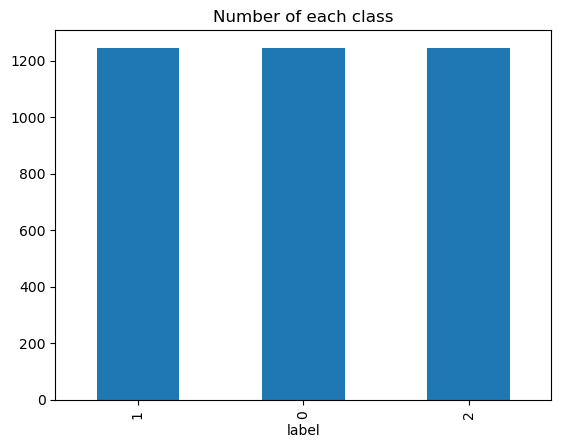

In [3]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
df['label'] = label_encoder.fit_transform(df['TRUE_SENTIMENT'].values) #neg = 0, #neu = 1, pos=2
# print(df.head(5))

# Fix class imbalance
class_count_0, class_count_1, class_count_2 = df['label'].value_counts()

class_0 = df[df['label'] == 0] # neg
class_1 = df[df['label'] == 1] # neu
class_2 = df[df['label'] == 2] # pos
print('class 0:', class_0.shape)
print('class 1:', class_1.shape)
print('class 2:', class_2.shape)

print(class_count_2)
class_0_over = class_0.sample(class_count_1, replace=True, ignore_index=True)
class_2_under = class_2.sample(class_count_1, ignore_index=True)

new_df = pd.concat([class_1, class_0_over, class_2_under], axis=0, ignore_index=True)

print("total class of 0, 1 and 2:", new_df['label'].value_counts()) # plot the count after under-sampeling
new_df['label'].value_counts().plot(kind='bar', title='Number of each class')

### Correlation Heat Map for Features 1 - 17 and Target Label

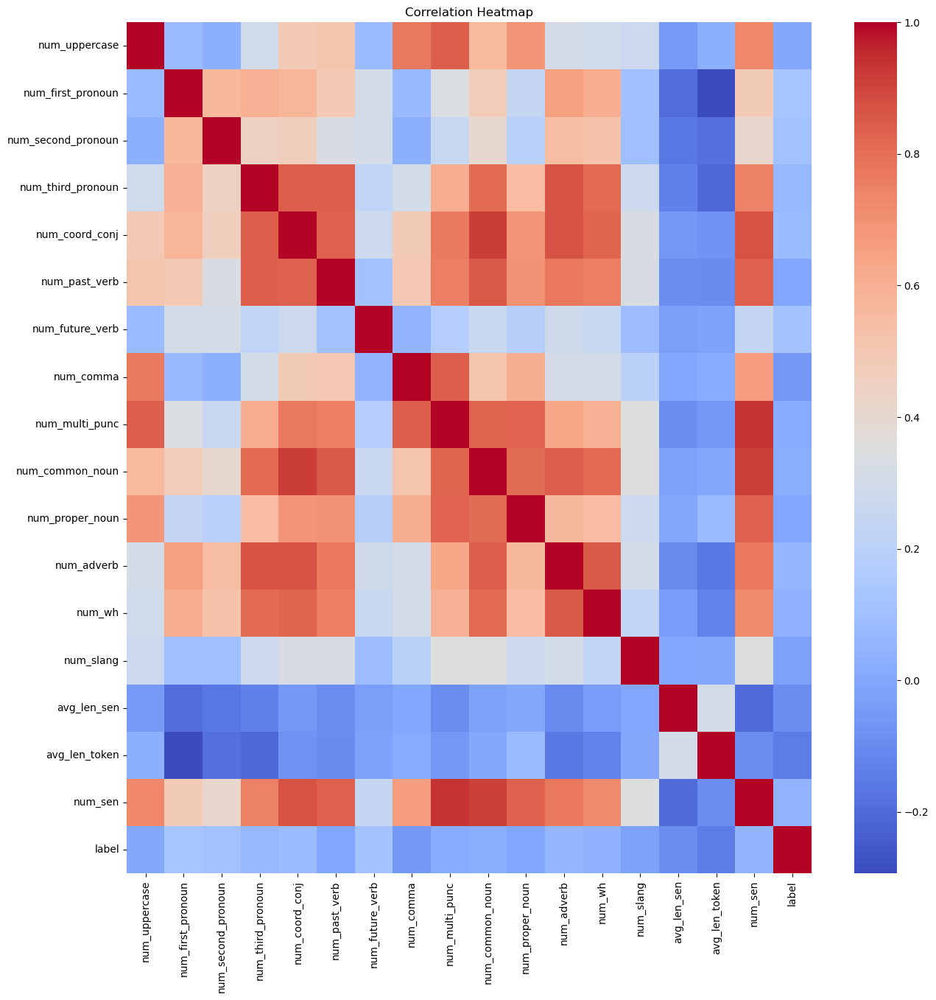

In [4]:
# Correlation matrix
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Calculate the correlation matrix
correlation_matrix = new_df.iloc[:, [6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, -1]].corr()

# Plot the heatmap
plt.figure(figsize=(15, 15))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10})
plt.title('Correlation Heatmap')
plt.show()

### Scatter Plot of Average Length of Token by Each Sentiment Class

In [5]:
# Visualization I
# !pip install plotly
import plotly.express as px 
 
# plotting the bubble chart
fig = px.scatter(new_df, x="TRUE_SENTIMENT", y="avg_len_token", 
                 size= "avg_len_sen", color="TRUE_SENTIMENT") 
fig.update_layout(title='Scatter plot of average length of token by each sentiment class',
                  xaxis_title='Sentiment Class',
                  yaxis_title='Average Length Token')
 
# showing the plot
fig.show()

### Scatter Plot of Number of Proper Nouns by Each Sentiment Class

In [6]:
# Visualization II
!pip install plotly
import plotly.express as px 
 
# plotting the bubble chart
fig = px.scatter(new_df, x="TRUE_SENTIMENT", y="num_proper_noun", 
                 size= "avg_len_sen", color="TRUE_SENTIMENT") 
fig.update_layout(title='Scatter plot of number of proper nouns by each sentiment class',
                  xaxis_title='Sentiment Class',
                  yaxis_title='Number of Proper Nouns')
 
 
# showing the plot
fig.show()

### Scatter Plot of Average Length of Sentence by Each Sentiment Class

In [7]:
# Visualization III
!pip install plotly
import plotly.express as px 
 
# plotting the bubble chart
fig = px.scatter(new_df, x="TRUE_SENTIMENT", y="num_past_verb", 
                 size= "avg_len_sen", color="TRUE_SENTIMENT") 
fig.update_layout(title='Scatter plot of number of past-tense verb by each sentiment class',
                  xaxis_title='Sentiment Class',
                  yaxis_title='Number of Past-Tense Verb')
 
 
# showing the plot
fig.show()

In [8]:
# Separate feat and label - data process
feat = new_df.iloc[:, 6:-2] 
feat_names = list(feat.columns)
label = new_df.loc[:, ['label']]

print(new_df)
print(feat.shape)
print(label.shape)
print(feat_names)

                                                  TITLE      TARGET_ENTITY  \
0     8th LD Writethru: 9th passenger released from ...    Rolando Mendoza   
1     AP Exclusive: Network flaw causes scary Web error            Sawyers   
2     Holyfield ' s wife says boxer hit her several ...    Candi Holyfield   
3          Hillary Clinton : Misogyny is ` endemic ' .     Hillary Clinton   
4             Trouser-wearing women fined $200 in Sudan      Lubna Hussein   
...                                                 ...                ...   
3733  Thousands travel to Yangon for Pope's diplomat...       Pope Francis   
3734  Er the Oscars' In Memoriam section showed a wo...        Jan Chapman   
3735            Big cat: Jack needs new home and a diet          Jack Jack   
3736  Woman accuses George H.W. Bush of groping her ...         H. W. Bush   
3737  Interview: Language cornerstone of Russia-Chin...  Elizabeth Pavlova   

                                               DOCUMENT TRUE_SE

In [9]:
# Train-Test split 
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    feat, label, test_size=0.2, random_state=1100)
print(X_train)
print(X_test)
print(y_train)
print(y_test)

      num_uppercase  num_first_pronoun  num_second_pronoun  num_third_pronoun  \
3212            1.0                5.0                 8.0               14.0   
325             0.0                0.0                 0.0                7.0   
1255            0.0                0.0                 0.0                1.0   
454             0.0                0.0                 0.0                7.0   
645             0.0                2.0                 2.0               10.0   
...             ...                ...                 ...                ...   
968             2.0                0.0                 0.0                9.0   
2288            0.0                5.0                 2.0               27.0   
2991            4.0                4.0                 0.0               14.0   
2093            2.0                0.0                 1.0                5.0   
3462            1.0                1.0                 0.0                2.0   

      num_coord_conj  num_p

In [10]:
# Train Xgboost - default
!pip install xgboost
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
import xgboost as xgb

# Init classifier
xgb_cl = xgb.XGBClassifier()

# Fit
xgb_cl.fit(X_train, y_train)

# Predict
preds = xgb_cl.predict(X_test)
accuracy = accuracy_score(y_test, preds)
f1 = f1_score(y_test, preds, average='macro')

# Score
print("F1 Score:", f1)
print("Accuracy:", accuracy)

F1 Score: 0.6538556985903352
Accuracy: 0.6564171122994652


In [11]:
# Grid search for Xgboost
from sklearn.model_selection import GridSearchCV

# Define the hyperparameter grid
param_grid = {
    'max_depth': [17, 20, 22], # 6, 7, 8, 10, 12, 15, 17, 20, 22
    'learning_rate': [0.02, 0.03], # 0.008, 0.009, 0.01, 0.02,0.03
    'subsample': [0.5] # 0.5, 0.6 
}

# Create the XGBoost model object
xgb_model = xgb.XGBClassifier()

# Create the GridSearchCV object
grid_search = GridSearchCV(xgb_model, param_grid, cv=5, scoring='accuracy')

# Fit the GridSearchCV object to the training data
grid_search.fit(X_train, y_train)

# Print the best set of hyperparameters and the corresponding score
print("Best set of hyperparameters: ", grid_search.best_params_)
print("Best score: ", grid_search.best_score_) # 0.6749163879598663

Best set of hyperparameters:  {'learning_rate': 0.03, 'max_depth': 20, 'subsample': 0.5}
Best score:  0.6678929765886288


In [12]:
# Train logistic regression 
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score

# Initialize the logistic regression model
model = LogisticRegression()

# Train the model
model.fit(X_train, y_train)

# Predict on the testing set
y_pred = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='macro')

print("F1 Score:", f1)
print("Accuracy:", accuracy)

/opt/conda/lib/python3.11/site-packages/sklearn/utils/validation.py:1183: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



F1 Score: 0.431597278233198
Accuracy: 0.43716577540106955


/opt/conda/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [13]:
# Train Decision Tree
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import f1_score

# Initialize the decision tree classifierd
dt_model = DecisionTreeClassifier()

# Train the model
dt_model.fit(X_train, y_train)

# Predict on the testing set
y_pred = dt_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='macro')

print("F1 Score:", f1)
print("Accuracy:", accuracy)

F1 Score: 0.6109020781073954
Accuracy: 0.6216577540106952


In [14]:
# Save best performing model
from sklearn.metrics import f1_score
model_file_path = 'xgboost_model.bin'
xgb_model = xgb.XGBClassifier(max_depth = 22, learning_rate = 0.02, subsample = 0.5)
xgb_model.fit(X_train, y_train)
preds = xgb_model.predict(X_test)
f1 = f1_score(y_test, preds, average='macro')

print("F1 Score:", f1)
print('Accuracy:', accuracy_score(y_test, preds))

# Save the trained model
xgb_model.save_model(model_file_path)

F1 Score: 0.6805725726632295
Accuracy: 0.6831550802139037


/opt/conda/lib/python3.11/site-packages/xgboost/core.py:160: UserWarning:

[20:43:26] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.



## Sentiment Analysis of ChatGPT's Response

In [15]:
# Predict on gpt's response

gpt3_df = pd.read_csv("response_gpt3.csv")
gpt3_df = gpt3_df.iloc[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 17, 18], :-1]

gpt4_df = pd.read_csv("response_gpt4.csv")
gpt4_df = gpt4_df.iloc[[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 17, 18], :-1]

preds_gpt3 = xgb_model.predict(gpt3_df) # make prediciton on gpt3's response
preds_gpt4 = xgb_model.predict(gpt4_df) # make prediction on gpt4's response

gpt3_df['predicted_sentiment'] = label_encoder.inverse_transform(preds_gpt3)
gpt4_df['predicted_sentiment'] = label_encoder.inverse_transform(preds_gpt4)

print(gpt3_df)
print(gpt4_df)

    num_uppercase  num_first_pronoun  num_second_pronoun  num_third_pronoun  \
1             0.0                2.0                 0.0                0.0   
2             1.0                0.0                 0.0               12.0   
3             1.0                0.0                 0.0               10.0   
4             0.0                0.0                 0.0                6.0   
5             0.0                1.0                 0.0               11.0   
6             0.0                0.0                 0.0               20.0   
7             2.0                0.0                 0.0               12.0   
8             0.0                0.0                 0.0                3.0   
9             4.0                0.0                 0.0                5.0   
10            0.0                4.0                 0.0                3.0   
17            2.0                0.0                 0.0                4.0   
18            0.0                0.0                

## SHAP Analysis of XGBoost

In [17]:
# Conduct SHAP analysis
# !pip install shap 
# !pip install xgboost
import shap
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
import xgboost as xgb
# print the JS visualization code to the notebook
shap.initjs()

# model_file_path = 'xgboost_model.bin'
# loaded_model = xgb.Booster()
# loaded_model.load_model(model_file_path)

# preds = loaded_model.predict(X_test)

# Shap values to see the feature importance
explainer = shap.TreeExplainer(xgb_model)
shap_values = explainer.shap_values(X_test, check_additivity=False)
print(shap_values.shape)
# print(explainer.expected_value)

shap.force_plot(explainer.expected_value[0], shap_values[:, :, 0])

(748, 216, 3)


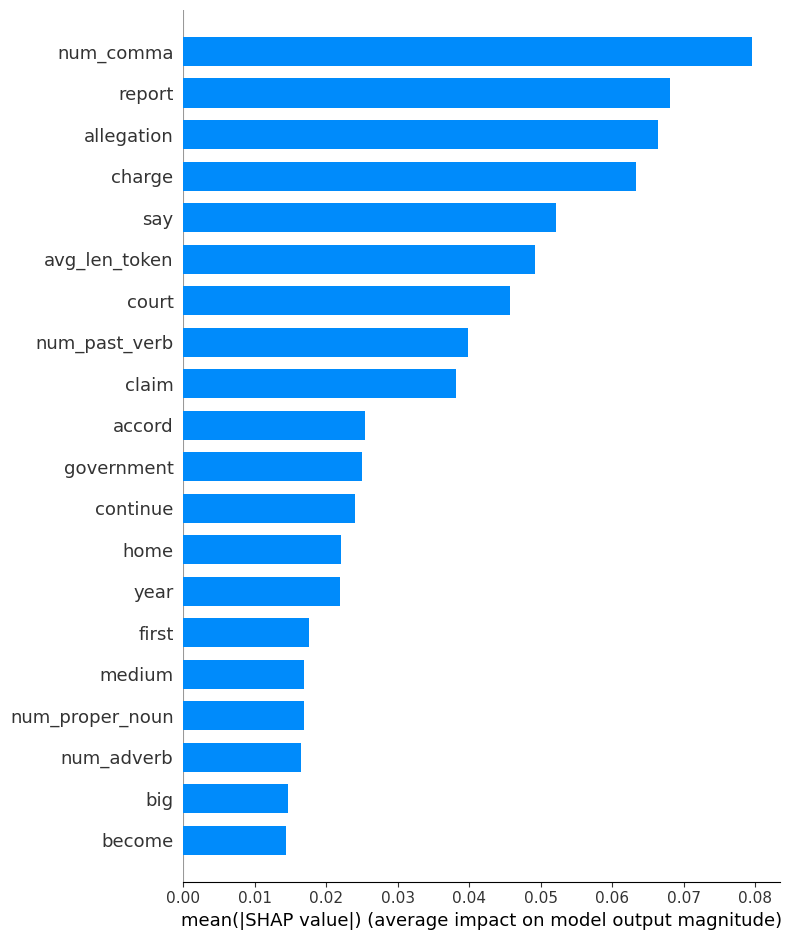

In [18]:
shap.summary_plot(shap_values[:, :, 0], features=feat, plot_type="bar") # class: negative

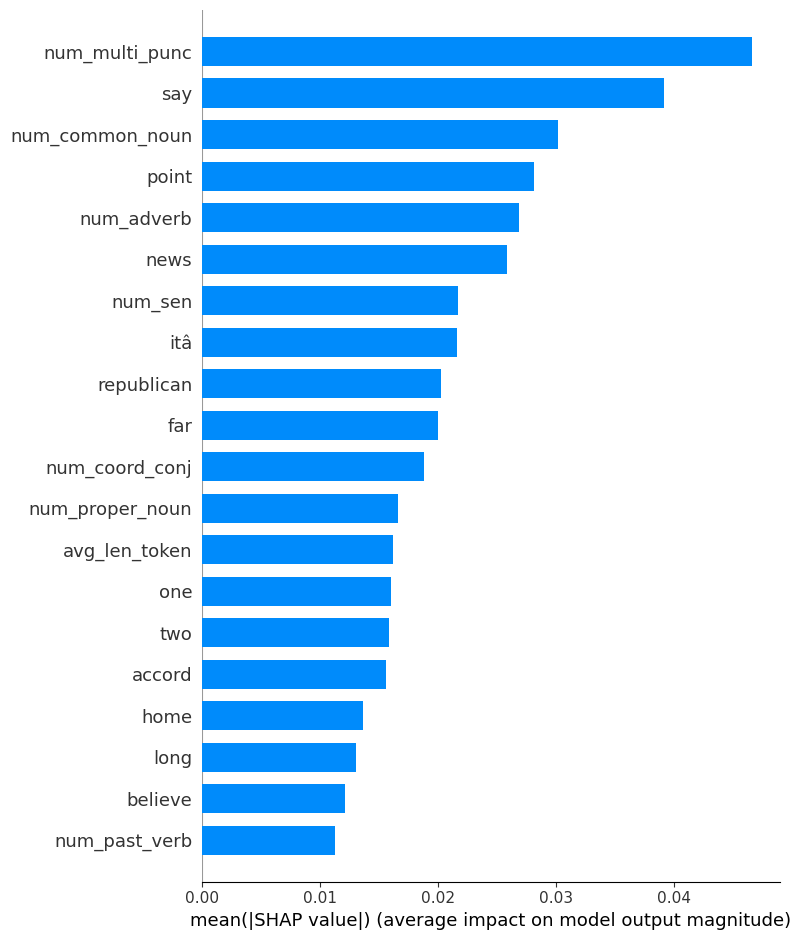

In [19]:
shap.summary_plot(shap_values[:, :, 1], features=feat, plot_type="bar") # class: neutral

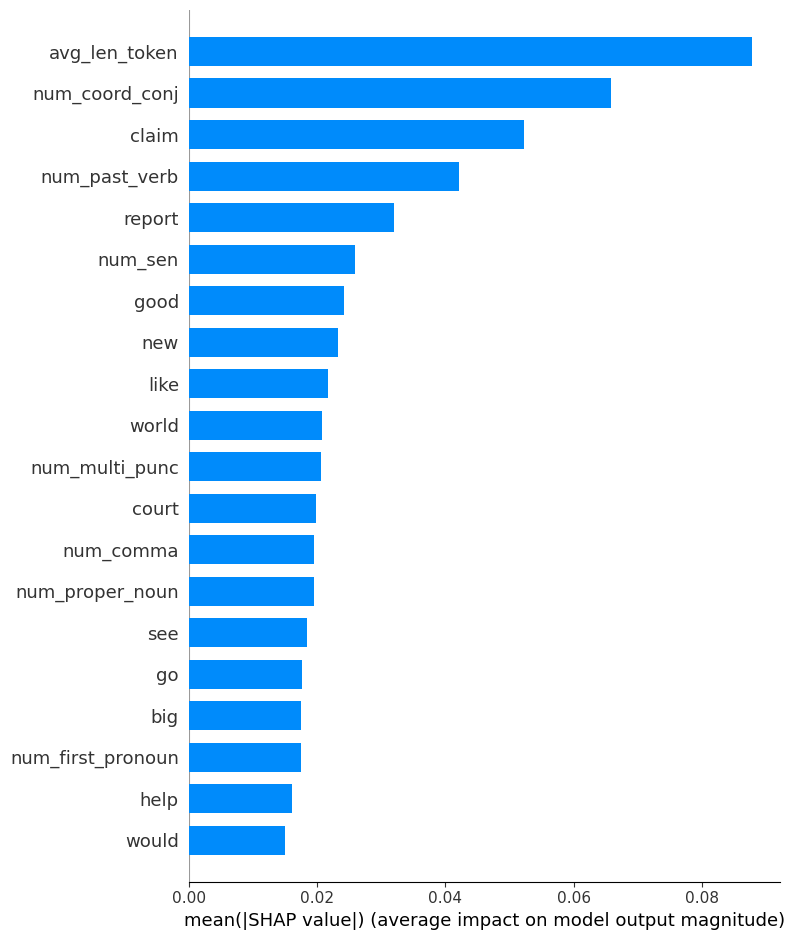

In [20]:
shap.summary_plot(shap_values[:, :, 2], features=feat, plot_type="bar") # class: positive

In [21]:
shap.force_plot(explainer.expected_value[1], shap_values[0, :, 1], features=feat.iloc[0, :]) # class: neutral